# Telecom Churn

#### Business Overview

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
**For many incumbent operators, retaining high profitable customers is the number one business goal.**

**To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.**

#### Objective

In this case study, we will 
* analyze customer-level data of a leading telecom firm, 
* build predictive models to identify customers at high risk of churn and 
* identify the main indicators of churn.

#### Load Data and Data Cleaning

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [2]:
# import numpy and pandas
import pandas as pd
import numpy as np

# import libraries for plotting

import matplotlib.pyplot as plt
from matplotlib.pyplot import xticks
import seaborn as sns
%matplotlib inline
# do an inline so that plt.show() is not required everytime


# import for pre-processing
# scale (this is same as standard scalar)
from sklearn.preprocessing import scale
# label encoding
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import KFold


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
# for deleting unused variables
import gc

/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [3]:
# load the telecom churn data
telecom_data = pd.read_csv('./telecom_churn_data.csv')

In [4]:
telecom_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
telecom_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [6]:
print(telecom_data.columns)

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)


In [7]:
telecom_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [8]:
# about the dataset
# dimensions
print("Dimensions: ", telecom_data.shape)

Dimensions:  (99999, 226)


In [9]:
#checking duplicate
len(telecom_data['mobile_number'].unique())
# No duplicate values

99999

In [10]:
# let us first extract list of columns containing recharge amount
recharge_amnt_columns =  telecom_data.columns[telecom_data.columns.str.contains('rech_amt|rech_data')]

print(recharge_amnt_columns)

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'date_of_last_rech_data_6',
       'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
       'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'av_rech_amt_data_9'],
      dtype='object')


In [11]:
#drop_single_value_columns
drop_cols = list(filter(lambda x : len(telecom_data[x].value_counts()) < 2, telecom_data.columns))
#print('Columns to be dropped: {0}',drop_cols)
telecom_data.drop(drop_cols,axis=1, inplace=True)

In [12]:
print("Dimensions: ", telecom_data.shape)

Dimensions:  (99999, 210)


In [13]:
#Renaming the Columns
telecom_data.rename(columns={'jun_vbc_3g': 'vbc_3g_6',
                                'jul_vbc_3g': 'vbc_3g_7',
                                'aug_vbc_3g': 'vbc_3g_8',
                                'sep_vbc_3g': 'vbc_3g_9'
                               }, inplace=True)

In [14]:
# Dataframe of only 9 month data for labelling
churn_phase = telecom_data.loc[:,['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']]
# Check if missing values in Key columns involved in labelling Churned Customers
#round((churn_phase.isnull().sum()/len(churn_phase.index))*100,2)
churners = pd.DataFrame()
churners =telecom_data.loc[(churn_phase.total_ic_mou_9 == 0.00) 
                            & (churn_phase.total_og_mou_9 == 0.00)
                            & (churn_phase.vol_2g_mb_9 == 0.00)
                            & (churn_phase.vol_3g_mb_9 == 0.00), ['mobile_number']
                           ]
# Add new column for Churn
churners['churn'] = 1

telecom_data = pd.merge(telecom_data, churners, how='outer', on='mobile_number')
telecom_data['churn'] = telecom_data['churn'].fillna(0)
telecom_data['churn'] = telecom_data['churn'].astype(int)
# Drop the 9th month columns (not needed for training model)
mont_9_columns = list(map(lambda x : x.endswith('_9'),telecom_data.columns))
telecom_data.drop(telecom_data.loc[:,mont_9_columns],axis = 1, inplace=True)

In [15]:
print("Dimensions: ", telecom_data.shape)

Dimensions:  (99999, 159)


In [16]:
# Derive new column for Average Recharge Amount in 6 and 7 months
telecom_data['d_av_rech_amt'] = round((telecom_data['total_rech_amt_6'] + telecom_data['total_rech_amt_7'])/2,2)
telecom_data['d_av_rech_amt_data'] = round((telecom_data['av_rech_amt_data_6']+telecom_data['av_rech_amt_data_7'])/2,2)

 # Filter for High Value Customers
telecom_data = telecom_data.loc[(telecom_data['d_av_rech_amt'] > telecom_data['d_av_rech_amt'].quantile(0.70)) |
                  (telecom_data['d_av_rech_amt_data'] > telecom_data['d_av_rech_amt_data'].quantile(0.70))]

telecom_data.drop(['d_av_rech_amt','d_av_rech_amt_data'], axis=1, inplace=True)


In [17]:
telecom_data['churn'].value_counts()

0    28986
1     2690
Name: churn, dtype: int64

In [18]:
print("Dimensions: ", telecom_data.shape)

Dimensions:  (31676, 159)


In [19]:
# Remove all records with negative values in Revenue columns for Call usage.
telecom_data = telecom_data.loc[(telecom_data.arpu_6 > 0) & (telecom_data.arpu_7 > 0) & (telecom_data.arpu_8 >0)]

In [20]:
#impute_night_pack_user
telecom_data['night_pck_user_6'] = telecom_data.loc[:,'night_pck_user_6'].fillna(-1).astype(int)
telecom_data['night_pck_user_7'] = telecom_data.loc[:,'night_pck_user_7'].fillna(-1).astype(int)
telecom_data['night_pck_user_8'] = telecom_data.loc[:,'night_pck_user_8'].fillna(-1).astype(int)

In [21]:
#impute_fb_user
telecom_data['fb_user_6'] =telecom_data.loc[:,'fb_user_6'].fillna(-1).astype(int)
telecom_data['fb_user_7'] =telecom_data.loc[:,'fb_user_7'].fillna(-1).astype(int)
telecom_data['fb_user_8'] =telecom_data.loc[:,'fb_user_8'].fillna(-1).astype(int)

In [22]:
telecom_data.fillna(0,inplace=True)

In [23]:
print("Dimensions: ", telecom_data.shape)

Dimensions:  (30343, 159)


In [24]:
telecom_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn
0,7000842753,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1,968,30.40,0.00,101.20,1
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,-1,802,57.74,19.38,18.74,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.

In [25]:
telecom_data.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn
count,3.034300e+04,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.00000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.000000,30343.0000

### EDA

Understand the datatype of all the columns as first step of EDA. This is done in batch of 40 items, to look at the Columns one by one.

In [26]:
telecom_data.iloc[:,0:40].info()
telecom_data.iloc[:,40:80].info()
telecom_data.iloc[:,80:130].info()
telecom_data.iloc[:,130:160].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30343 entries, 0 to 99997
Data columns (total 40 columns):
mobile_number       30343 non-null int64
arpu_6              30343 non-null float64
arpu_7              30343 non-null float64
arpu_8              30343 non-null float64
onnet_mou_6         30343 non-null float64
onnet_mou_7         30343 non-null float64
onnet_mou_8         30343 non-null float64
offnet_mou_6        30343 non-null float64
offnet_mou_7        30343 non-null float64
offnet_mou_8        30343 non-null float64
roam_ic_mou_6       30343 non-null float64
roam_ic_mou_7       30343 non-null float64
roam_ic_mou_8       30343 non-null float64
roam_og_mou_6       30343 non-null float64
roam_og_mou_7       30343 non-null float64
roam_og_mou_8       30343 non-null float64
loc_og_t2t_mou_6    30343 non-null float64
loc_og_t2t_mou_7    30343 non-null float64
loc_og_t2t_mou_8    30343 non-null float64
loc_og_t2m_mou_6    30343 non-null float64
loc_og_t2m_mou_7    30343 non-nul

In [27]:
telecom_data['churn'].value_counts()

0    28468
1     1875
Name: churn, dtype: int64

Text(0.5,1,'Churn status Distribution')

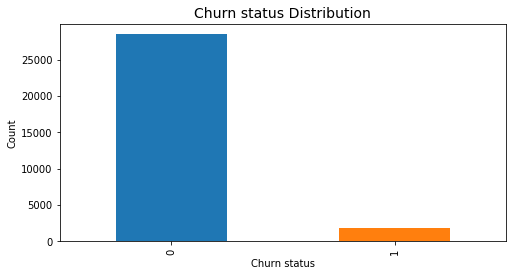

In [28]:
plt.figure(figsize=(8,4))
telecom_data['churn'].value_counts().plot(kind = 'bar')
plt.ylabel('Count')
plt.xlabel('Churn status')
plt.title('Churn status Distribution',fontsize=14)

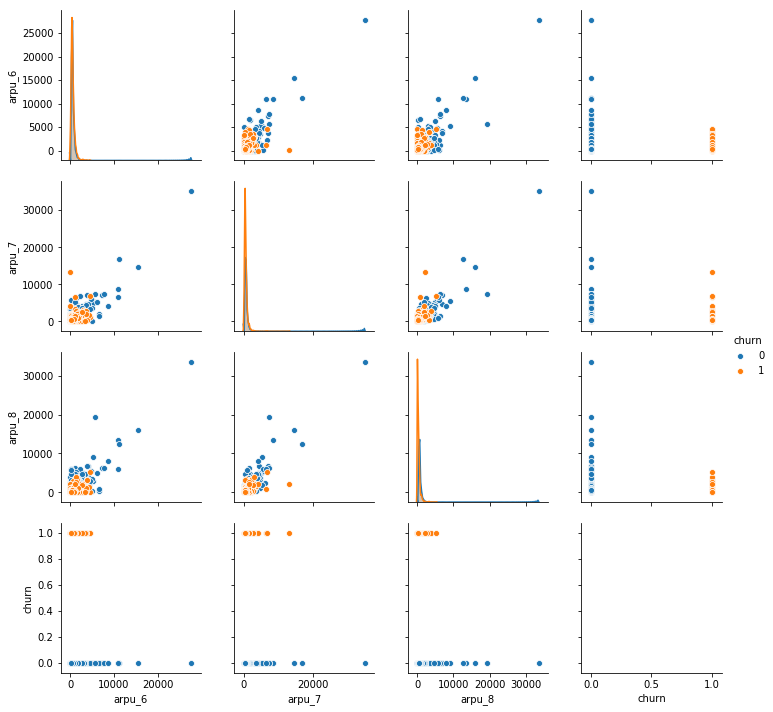

In [29]:
## arpu (Average Revenue per user)
sns.pairplot(data=telecom_data[['arpu_6','arpu_7','arpu_8','churn']],hue='churn')

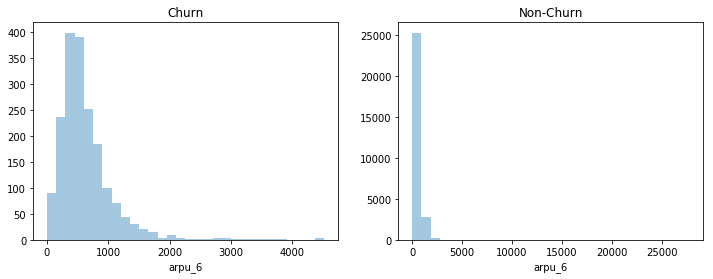

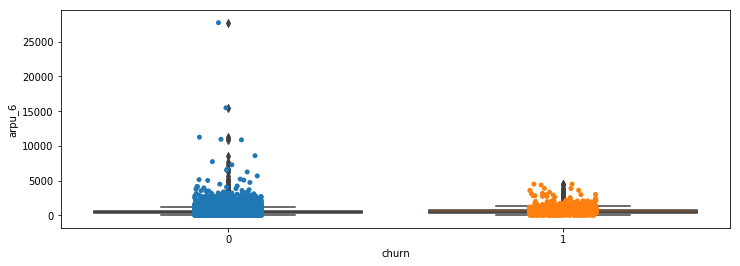

In [30]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12, 4))
ax = sns.distplot(telecom_data[telecom_data['churn']==1].arpu_6, bins = 30, ax = axes[0], kde = False)
ax.set_title('Churn')
ax = sns.distplot(telecom_data[telecom_data['churn']==0].arpu_6, bins = 30, ax = axes[1], kde = False)
ax.set_title('Non-Churn')

fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(12, 4))
sns.boxplot(x='churn', y='arpu_6', data=telecom_data)
sns.stripplot(x='churn', y='arpu_6', data=telecom_data, jitter=True, edgecolor="gray")

In [31]:
telecom_data['date_of_last_rech_6'] = pd.to_datetime(telecom_data['date_of_last_rech_6'])
telecom_data['date_of_last_rech_7'] = pd.to_datetime(telecom_data['date_of_last_rech_7'])
telecom_data['date_of_last_rech_8'] = pd.to_datetime(telecom_data['date_of_last_rech_8'])

telecom_data['date_of_last_rech_data_6'] = pd.to_datetime(telecom_data['date_of_last_rech_data_6'])
telecom_data['date_of_last_rech_data_7'] = pd.to_datetime(telecom_data['date_of_last_rech_data_7'])
telecom_data['date_of_last_rech_data_8'] = pd.to_datetime(telecom_data['date_of_last_rech_data_8'])

In [32]:
df = telecom_data
## Derive new features based on the current features 
# Metric:average revenue per user 
# average revenue per user in a single column and split by average vs first two months average 
df['arpu_2mths'] = (df['arpu_6']+df['arpu_7'])/2
df['arpu_4mths'] = (df['arpu_6']+df['arpu_7']+df['arpu_8'])/3

In [33]:
# Metric:average revenue per user 
# average revenue per user in a single column and split by average vs first two months average 
df['avg_tot_rech_2mths'] = (df['total_rech_amt_6']+df['total_rech_amt_7'])/2
df['avg_tot_rech_4mths'] = (df['total_rech_amt_6']+df['total_rech_amt_7']+df['total_rech_amt_8'])/3

In [34]:
# Metric: age on network 
# Conversion of the number of months by 12
df['aon_years']=df['aon']/365
df['aon_years'] = df['aon_years'].astype(int)

In [35]:
def plot_for_seg_univariate(column_name,y_col_name,df_segment):
    plt.suptitle('Segmented Univariate Analysis (' + column_name + ')', fontsize=24)
    plt.rc("font", size=10)
    plt.figure(figsize=(10, 8))
    sns.barplot(x=df_segment.index, y=y_col_name, data=df_segment)
    plt.title('Age vs Average revenue ' + column_name)
    plt.xlabel(column_name,rotation=0, fontsize=20, labelpad=20)
    plt.xticks(rotation=45,fontsize=10)
    plt.ylabel('Age to Average revenue  ',rotation=90, fontsize=20, labelpad=20)
    plt.show()
    return

In [36]:
def plot_by_segment_numbins(column,new_bin_col_name,y_col_name,binval,showsize=10):
        df[new_bin_col_name] = pd.cut(df[column], binval)
        df_num_column_status=df.pivot_table(values=[y_col_name],index=[new_bin_col_name],aggfunc='mean')
        df_num_column_status.head(showsize)
        return df_num_column_status

In [37]:
def plot_by_grouped_barcharts(df_segment,label,showsize=10):
        colors = ['green', 'red']
        ax=df_segment.plot(kind='bar',figsize=(10,8),color=colors)
        ax.set_xlabel(label, fontsize=12)
        ax.set_ylabel("Churn", fontsize=12)
        plt.show()
        return 

In [38]:
def create_bin(column,new_bin_col_name,binval):
    df[new_bin_col_name] = pd.cut(df[column], binval)
    return df

               arpu_2mths
aon_group                
(6.6, 7.7]     559.954695
(8.8, 9.9]     559.998945
(7.7, 8.8]     565.525424
(5.5, 6.6]     569.081923
(4.4, 5.5]     569.446762
(-0.011, 1.1]  572.131442
(2.2, 3.3]     574.703067
(1.1, 2.2]     577.689306
(9.9, 11.0]    581.977747
(3.3, 4.4]     586.316275


<Figure size 432x288 with 0 Axes>

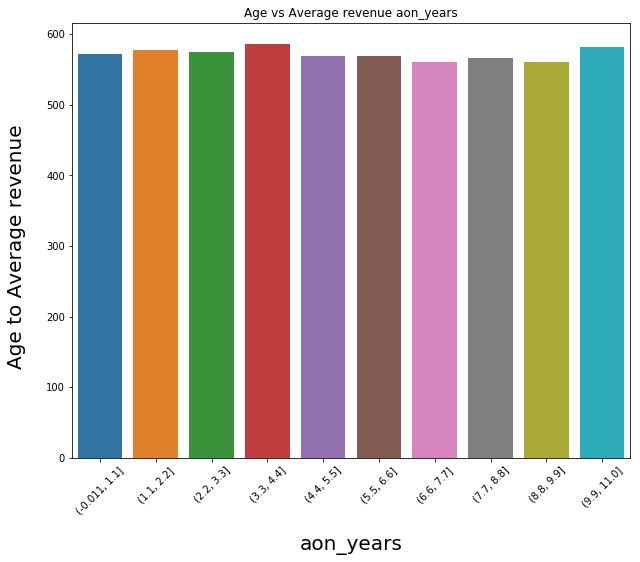

In [39]:
df2=plot_by_segment_numbins('aon_years','aon_group','arpu_2mths',10).sort_values(by='arpu_2mths',ascending=True)
print(df2)
plot_for_seg_univariate('aon_years','arpu_2mths',df2)

In [40]:
def plot_continuous_variable_boxPlot(df,param):
    
    '''Function plots a graphical Boxplot for the passed dataframe.

        Input:
            param: name of the parameter for which Box is plotted.
            df: pandas DataFrame'''
    
    not_churned_df=df[df.churn == 0]
    churned_df=df[df.churn  == 1]
    
    plt.figure(figsize=(20, 10)) 
    plt.subplot(1,2,1)
    sns.boxplot(y=not_churned_df[param])
    plt.title(param +' distribution for Not Churned ',fontsize=20)
    
    plt.subplot(1,2,2)
    sns.boxplot(y=churned_df[param])
    plt.title(param +' distribution for Churned ',fontsize=20)
    plt.show()

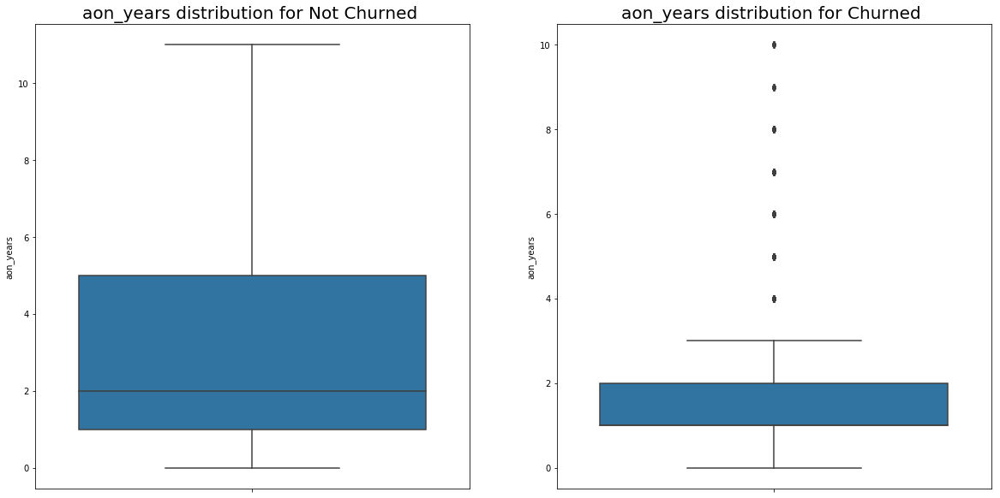

In [41]:
aon_df = df[['churn','aon_years']]
plot_continuous_variable_boxPlot(aon_df,'aon_years')

In [42]:
df['aon_years'].value_counts()

1     7702
0     4859
2     4681
3     3103
6     2109
4     1997
7     1869
8     1565
5     1282
9      582
10     566
11      28
Name: aon_years, dtype: int64

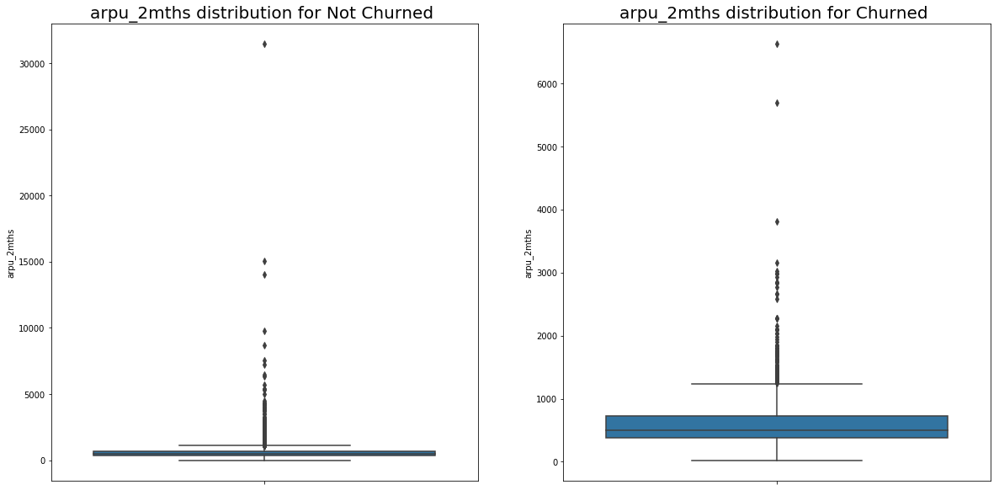

In [43]:
arpu_df = df[['churn','arpu_2mths']]
plot_continuous_variable_boxPlot(arpu_df,'arpu_2mths')

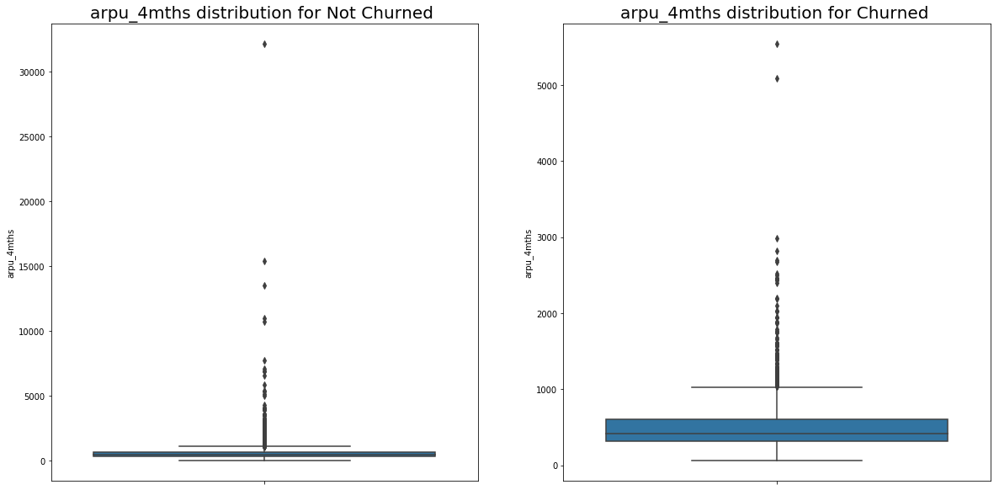

In [44]:
arpu_4df = df[['churn','arpu_4mths']]
plot_continuous_variable_boxPlot(arpu_4df,'arpu_4mths')

churn              0     1
aon_group                 
(-0.011, 1.1]  11520  1041
(1.1, 2.2]      4306   375
(2.2, 3.3]      2949   154
(3.3, 4.4]      1918    79
(4.4, 5.5]      1241    41
(5.5, 6.6]      2043    66
(6.6, 7.7]      1813    56
(7.7, 8.8]      1527    38
(8.8, 9.9]       569    13
(9.9, 11.0]      582    12


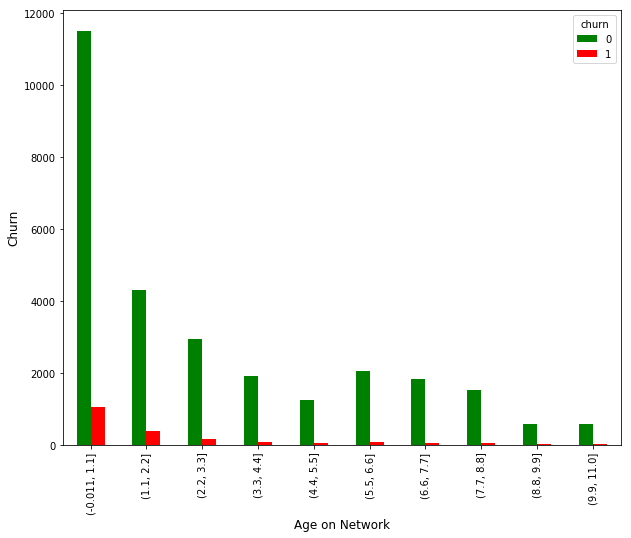

In [45]:
df_mod=pd.pivot_table(df, index='aon_group', columns=['churn'],values='aon', aggfunc='count')
print(df_mod)
plot_by_grouped_barcharts(df_mod,'Age on Network')

churn                       0     1
arpu_group_2mths                   
(-26.453, 3148.328]     28435  1871
(3148.328, 6291.676]       24     3
(6291.676, 9435.024]        5     1
(9435.024, 12578.372]       1     0
(12578.372, 15721.72]       2     0
(28295.113, 31438.461]      1     0


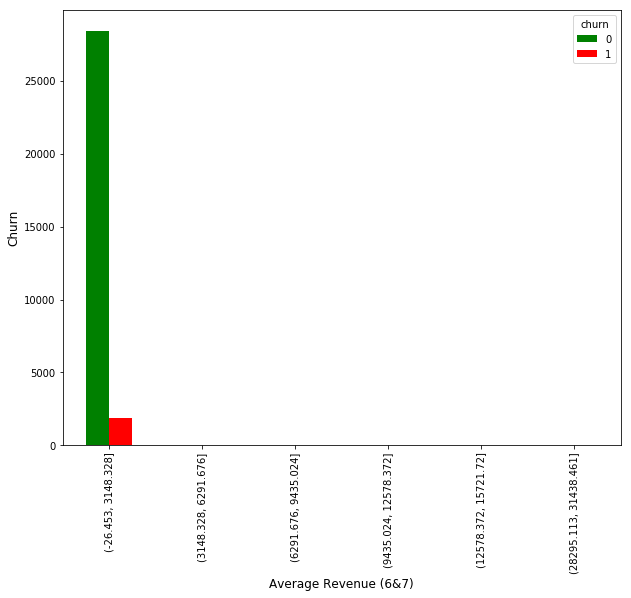

In [46]:

df=create_bin('arpu_2mths','arpu_group_2mths',10)
df_mod=pd.pivot_table(df, index='arpu_group_2mths', columns=['churn'],values='arpu_2mths', aggfunc = 'count',fill_value=0)
print(df_mod)
plot_by_grouped_barcharts(df_mod,'Average Revenue (6&7)')


churn                         0     1
max_rech_amt_group_2mths             
(-3.1, 1033.333]          28379  1861
(1033.333, 2066.667]         83    12
(2066.667, 3100.0]            6     2


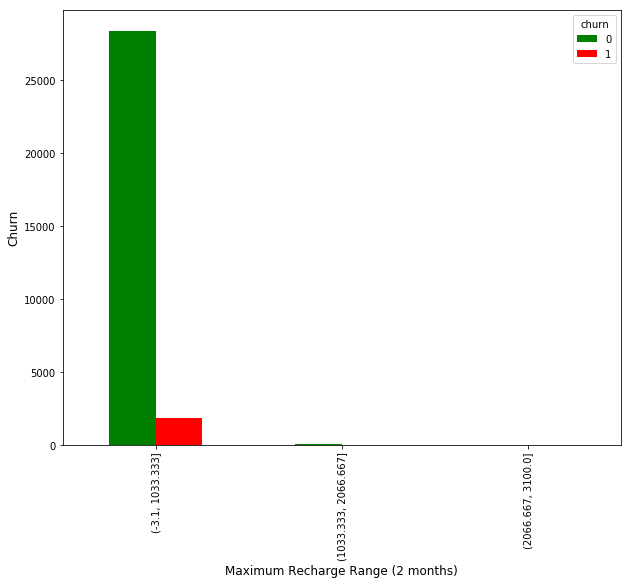

In [47]:
df['avg_max_rech_amt']=(df['max_rech_amt_6']+df['max_rech_amt_7'])/2
df=create_bin('avg_max_rech_amt','max_rech_amt_group_2mths',3)
df_mod=pd.pivot_table(df, index='max_rech_amt_group_2mths', columns=['churn'],values='avg_max_rech_amt', aggfunc = 'count',fill_value=0)
print(df_mod)
plot_by_grouped_barcharts(df_mod,'Maximum Recharge Range (2 months)')

churn                           0     1
total_rech_amt_group_2mths             
(-37.762, 7552.5]           28461  1873
(7552.5, 15105.0]               3     2
(15105.0, 22657.5]              3     0
(30210.0, 37762.5]              1     0


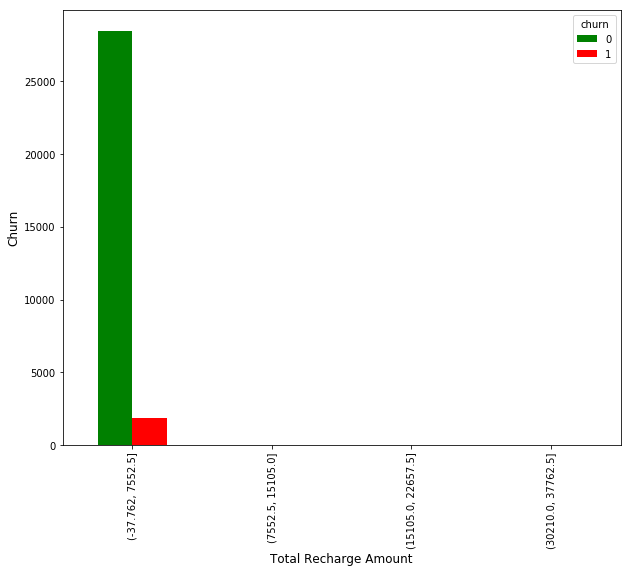

In [48]:
df['avg_total_rech_amt']=(df['total_rech_amt_6']+df['total_rech_amt_7'])/2
df=create_bin('avg_total_rech_amt','total_rech_amt_group_2mths',5)
df_mod=pd.pivot_table(df, index='total_rech_amt_group_2mths', columns=['churn'],values='avg_total_rech_amt', aggfunc = 'count',fill_value=0)
print(df_mod)
plot_by_grouped_barcharts(df_mod,'Total Recharge Amount')

['mobile_number', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_i

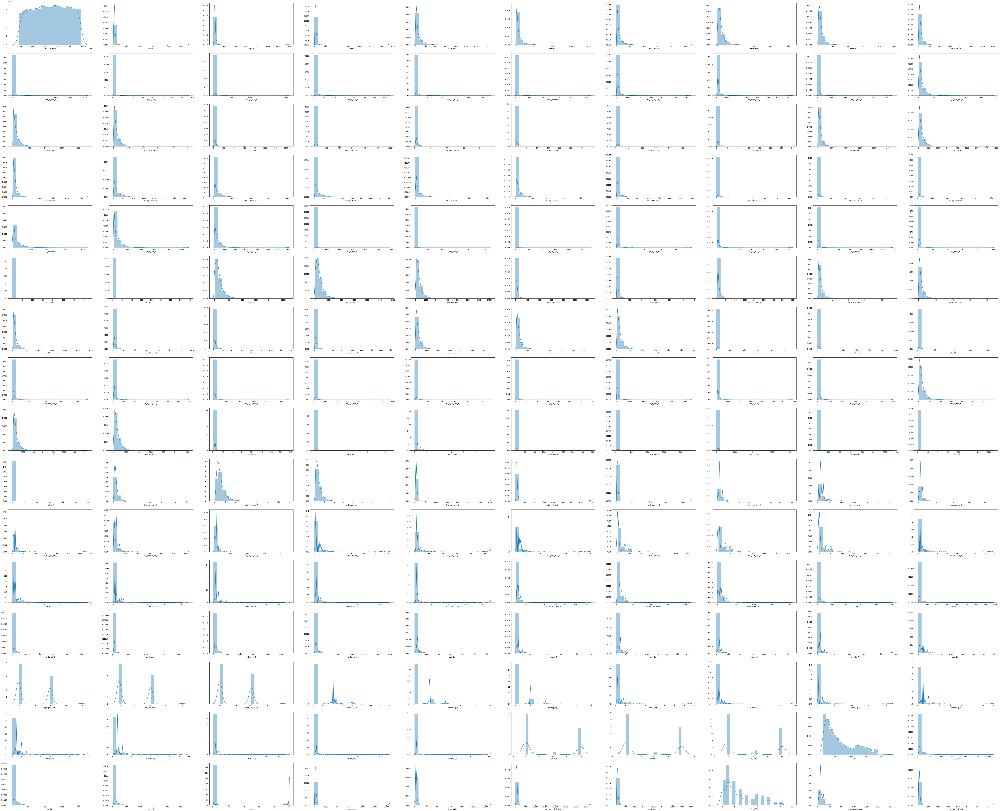

In [49]:
numerical_values= list(df._get_numeric_data())
print(numerical_values)
plt.figure(figsize=(120, 100))
for var in numerical_values:
        plt.subplot(16,10,numerical_values.index(var)+1)      
        sns.distplot( telecom_data[var],bins=20)
plt.show()

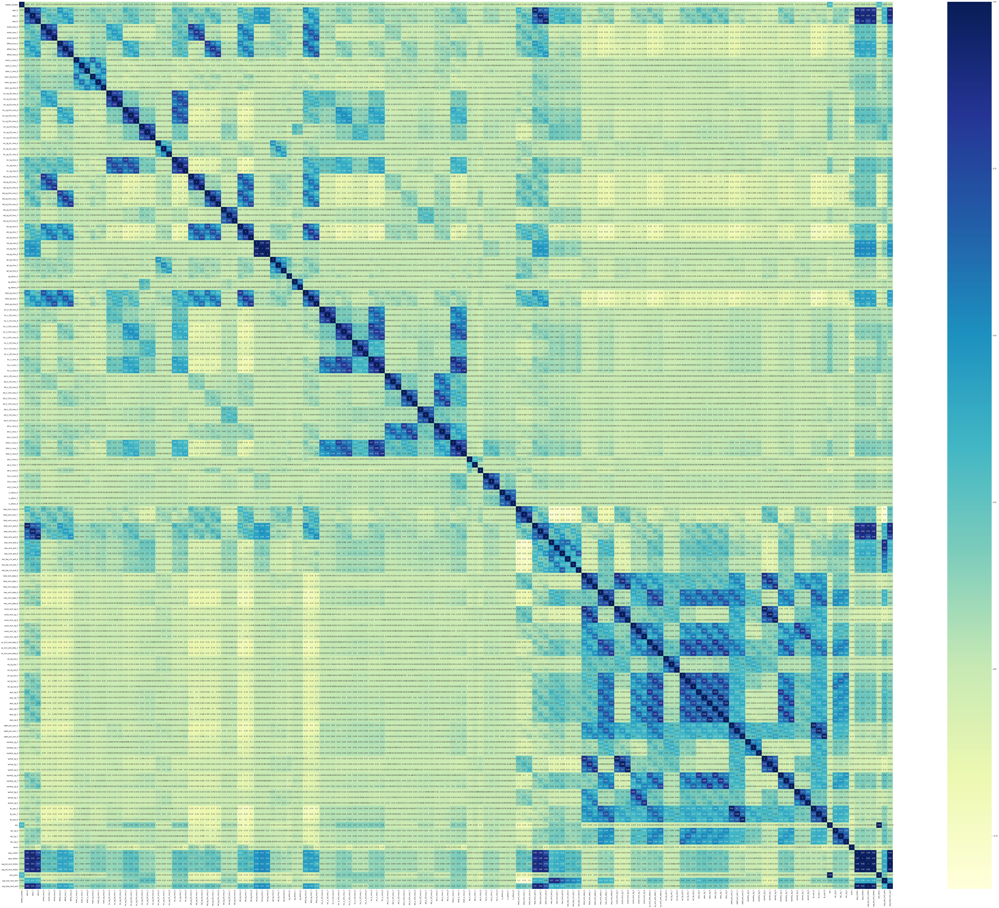

In [50]:
# Let's see the correlation matrix 
#upper = df._get_numeric_data().corr()

plt.figure(figsize = (120, 100))        # Size of the figure
sns.heatmap(df._get_numeric_data().corr(),annot = True,cmap="YlGnBu")
plt.show()

In [51]:
# create function to anlyze the features across 6th, 7th and 8th month
def analyze_feature(feature_start):
    plt.rcParams["figure.figsize"] = [17, 7]
    fig = plt.figure()
    print("Churn Stats (mean and standard deviation):")
    cols = {c: feature_start + "_" + str(c) for c in [6,7,8]}
    print(cols)
    frame_data = []
    [frame_data.append({
        "mean_6": telecom_data[telecom_data["churn"] == churn][cols[6]].mean(),
        "mean_7": telecom_data[telecom_data["churn"] == churn][cols[7]].mean(),
        "mean_8": telecom_data[telecom_data["churn"] == churn][cols[8]].mean(),
        "std_6": telecom_data[telecom_data["churn"] == churn][cols[6]].std(),
        "std_7": telecom_data[telecom_data["churn"] == churn][cols[7]].std(),
        "std_8": telecom_data[telecom_data["churn"] == churn][cols[8]].std()
    }) for churn in [0,1]]
    
    f,axes = plt.subplots(nrows=1, ncols=3)
    sns.boxplot(data=telecom_data, y=feature_start + "_6", x="churn",
                hue="churn", linewidth=2.5, showfliers=False, ax=axes[0])
    sns.boxplot(data=telecom_data, y=feature_start + "_7",  x="churn",
                hue="churn", linewidth=2.5, showfliers=False, ax=axes[1])
    sns.boxplot(data=telecom_data, y=feature_start + "_8",  x="churn",
                hue="churn", linewidth=2.5, showfliers=False, ax=axes[2])
    return pd.DataFrame(frame_data,index={"Non Churned","Churned"}).round(2)

In [52]:
#let's again extract the recharge amount related columns
recharge_amnt_columns =  telecom_data.columns[telecom_data.columns.str.contains('rech_amt')]

recharge_amnt_columns

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'avg_max_rech_amt', 'max_rech_amt_group_2mths', 'avg_total_rech_amt',
       'total_rech_amt_group_2mths'],
      dtype='object')

Churn Stats (mean and standard deviation):
{6: 'total_rech_amt_6', 7: 'total_rech_amt_7', 8: 'total_rech_amt_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,666.33,679.45,632.04,521.07,547.61,592.53
Non Churned,757.00,715.56,349.35,568.62,678.41,478.45


<Figure size 1224x504 with 0 Axes>

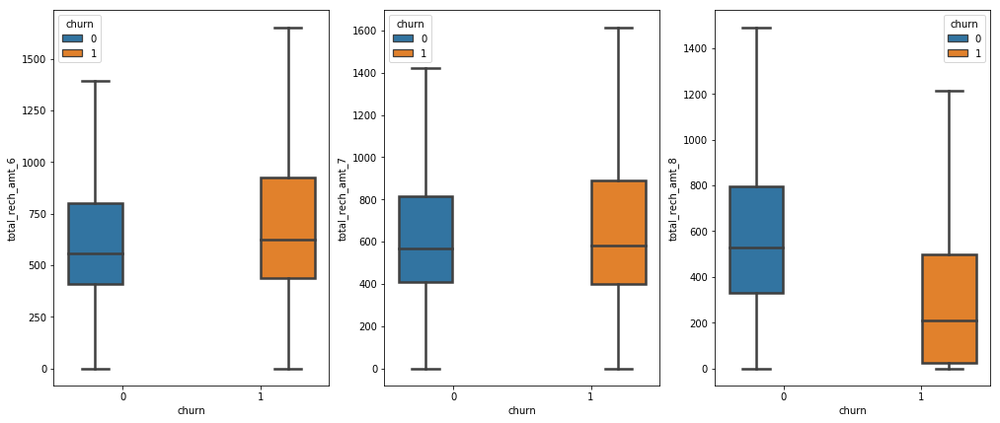

In [53]:
# let's analyze total recharge amount:
analyze_feature('total_rech_amt')

Churn Stats (mean and standard deviation):
{6: 'av_rech_amt_data_6', 7: 'av_rech_amt_data_7', 8: 'av_rech_amt_data_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,104.58,113.26,106.15,196.50,204.73,194.55
Non Churned,65.12,71.63,32.62,155.52,183.44,123.65


<Figure size 1224x504 with 0 Axes>

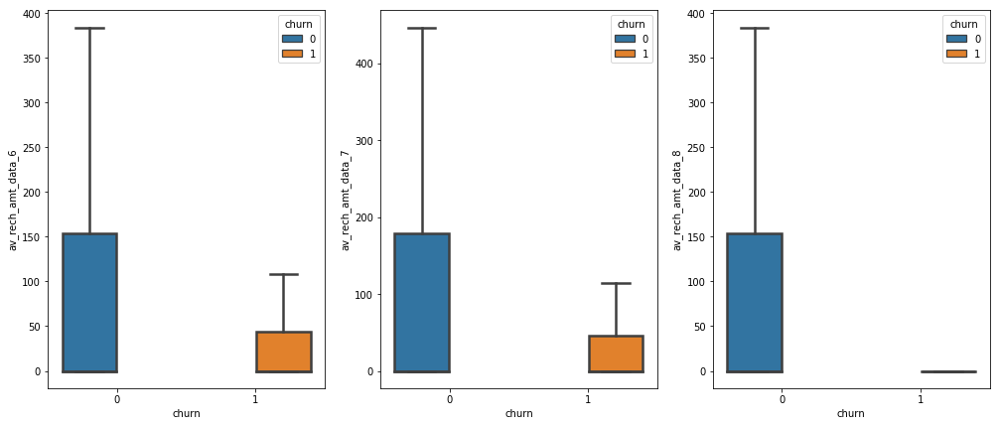

In [54]:
# let's analyze total recharge amount for data:
analyze_feature('av_rech_amt_data')

We see that there is a significant drop in total recharge amount for data in 8th month (action phase) for churned customers.

Churn Stats (mean and standard deviation):
{6: 'max_rech_amt_6', 7: 'max_rech_amt_7', 8: 'max_rech_amt_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,170.44,175.02,170.26,163.69,168.16,166.08
Non Churned,162.73,168.46,115.00,199.99,223.20,187.94


<Figure size 1224x504 with 0 Axes>

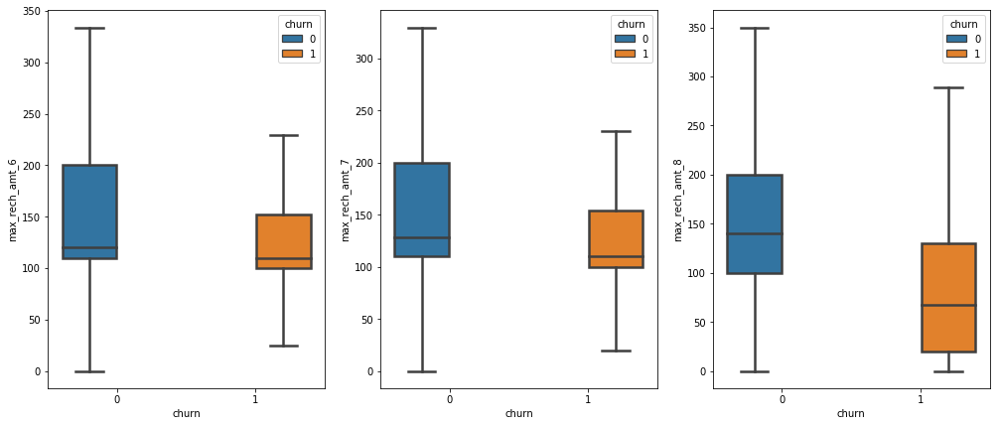

In [55]:
# let's analyze maximum recharge amount for data:
analyze_feature('max_rech_amt')

We observe drop in maximum recharge amount as well.

Churn Stats (mean and standard deviation):
{6: 'last_day_rch_amt_6', 7: 'last_day_rch_amt_7', 8: 'last_day_rch_amt_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,103.3,105.60,100.98,132.35,133.18,141.66
Non Churned,100.0,90.05,47.49,161.22,156.08,140.73


<Figure size 1224x504 with 0 Axes>

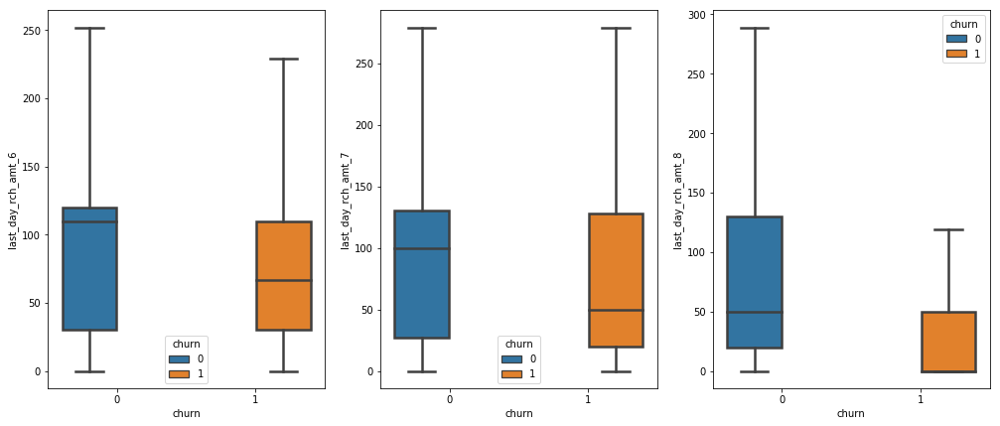

In [56]:
# let's check the mean variation in last day recharge for churned and non churned customers
analyze_feature('last_day_rch_amt')

We can see that there is a significant drop in last month recharge amount for churned customers.

In [57]:
# let's check the age on n/w for churned and non churned customers
print(df.loc[df.churn==1,'aon'].mean())
print(df.loc[df.churn==0,'aon'].mean())

899.8368
1294.7587115357594


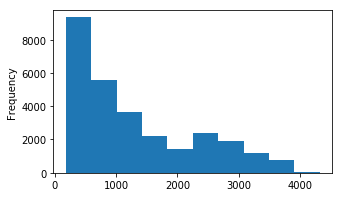

In [58]:
# let's check the age distribution for non churned customers
plt.figure(figsize=(5,3))
df.loc[df.churn==0,'aon'].plot.hist()

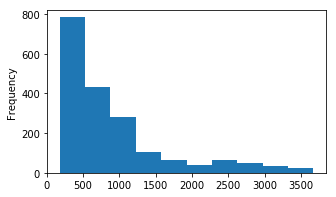

In [59]:
# let's check the age distribution for churned customers
plt.figure(figsize=(5,3))
telecom_data.loc[telecom_data.churn==1,'aon'].plot.hist()

### Model building

In this section we will build multiple machine learning models to accurately predict customers who might churn in the action phase (8th Month)

Let's drop date,category,object related features as we derived new features out of it

In [60]:
df.drop(list(df.select_dtypes(include=['datetime64']).columns),axis=1,inplace=True)

In [61]:
df.drop(columns = list(df.select_dtypes(include=['category']).columns), axis =1, inplace = True)

In [62]:
df.drop(columns = list(df.select_dtypes(include=[object]).columns), axis = 1, inplace = True)

In [63]:
df.shape

(30343, 160)

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30343 entries, 0 to 99997
Columns: 160 entries, mobile_number to avg_total_rech_amt
dtypes: float64(126), int64(34)
memory usage: 37.3 MB


In [65]:
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30343 entries, 0 to 99997
Data columns (total 160 columns):
mobile_number         int64
arpu_6                float64
arpu_7                float64
arpu_8                float64
onnet_mou_6           float64
onnet_mou_7           float64
onnet_mou_8           float64
offnet_mou_6          float64
offnet_mou_7          float64
offnet_mou_8          float64
roam_ic_mou_6         float64
roam_ic_mou_7         float64
roam_ic_mou_8         float64
roam_og_mou_6         float64
roam_og_mou_7         float64
roam_og_mou_8         float64
loc_og_t2t_mou_6      float64
loc_og_t2t_mou_7      float64
loc_og_t2t_mou_8      float64
loc_og_t2m_mou_6      float64
loc_og_t2m_mou_7      float64
loc_og_t2m_mou_8      float64
loc_og_t2f_mou_6      float64
loc_og_t2f_mou_7      float64
loc_og_t2f_mou_8      float64
loc_og_t2c_mou_6      float64
loc_og_t2c_mou_7      float64
loc_og_t2c_mou_8      float64
loc_og_mou_6          float64
loc_og_mou_7          

In [66]:
df.isnull().values.any()

False

In [67]:
# Putting feature variable to X
df2=df
#X = df2.drop(['churn','mobile_number'],axis=1)
X = df2[df2.columns[~df2.columns.isin(['churn','mobile_number'])]]

# Putting response variable to y
y = df2['churn']

In [68]:
from sklearn.preprocessing import MinMaxScaler
# Using MinMaxScaler to scale all the numeric variables in the same scale between 0 and 1.
scaler = MinMaxScaler()

In [69]:
from sklearn.model_selection import train_test_split

### Feature Scaling

We will now train different models on this dataset.

Scaling all values will reduce the distortion due to exceptionally high values and make algorithms converge faster.

In [70]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

We will split the data into a training and a test part. The models will be trained on the training data set and tested on the test data set

In [71]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_std,y, train_size=0.7,test_size=0.3,random_state=111)

In [72]:
print("Training dataset size",X_train.shape)
print("Training dataset target size",y_train.shape)
print("Test dataset size",X_test.shape)
print("Test dataset target size",y_test.shape)

Training dataset size (21240, 158)
Training dataset target size (21240,)
Test dataset size (9103, 158)
Test dataset target size (9103,)


In [73]:
X_test_std = scaler.fit_transform(X_test)

In [74]:
from sklearn.metrics import confusion_matrix

# define function to calculate and print model metrics.
def printMetrics(y_test,y_pred):
    cp = confusion_matrix(y_test,y_pred)
    total1=sum(sum(cp))
    accuracy= (cp[0,0]+cp[1,1])/total1
    sensitivity = cp[0,0]/(cp[0,0]+cp[0,1])
    specificity =  cp[1,1]/(cp[1,0]+cp[1,1])
    precision = cp[0,0]/(cp[0,0]+cp[1,0])
    print('Confusion Matrix: \n',cp)
    print("Sensitivity: ", sensitivity)
    print("Specificity: ",specificity)
    print("Precision: ",precision)
    print("Accuracy: ",accuracy)

#### PCA

n observations with p features can be interpreted as n points in a p-dimensional space. PCA aims to project this space into a q-dimensional subspace (with q<p) with as little information loss as possible.
It does so by finding the q directions in which the n points vary the most (the principal components). It then projects the original data points into the q-dimensional subspace. PCA returns a n x q dimensional matrix.

Using PCA on our data will decrease the amount of operations during training and testing

In [75]:
#Importing the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [76]:
pca.fit(X_train)


PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

In [77]:
pca.components_

array([[ 8.52392216e-02,  8.94839830e-02,  9.07135479e-02, ...,
         1.60051007e-02,  1.04255647e-01,  9.25180899e-02],
       [ 1.90815933e-01,  1.99693488e-01,  1.85922474e-01, ...,
         8.32994087e-03,  7.52208808e-02,  2.12917496e-01],
       [ 5.80489085e-02,  7.64316674e-02,  5.80012410e-02, ...,
        -9.98468542e-02, -4.13887235e-02,  7.27952220e-02],
       ...,
       [-0.00000000e+00, -1.69132235e-16, -1.15031846e-03, ...,
         1.70006289e-16,  2.46823559e-02,  3.31180002e-02],
       [ 0.00000000e+00, -7.38910891e-17,  8.85777819e-08, ...,
         1.69816197e-17, -2.36602167e-06,  7.07105899e-01],
       [-4.57641155e-01, -4.89750335e-01, -1.44201533e-01, ...,
         1.04083409e-17,  2.25108607e-04, -7.30259186e-04]])

In [78]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,0.085239,0.190816,arpu_6
1,0.089484,0.199693,arpu_7
2,0.090714,0.185922,arpu_8
3,-0.039359,0.091041,onnet_mou_6
4,-0.039391,0.098401,onnet_mou_7


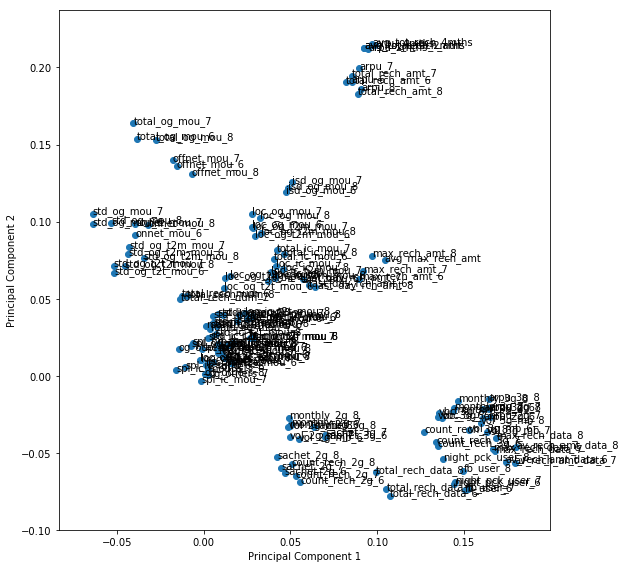

In [79]:
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

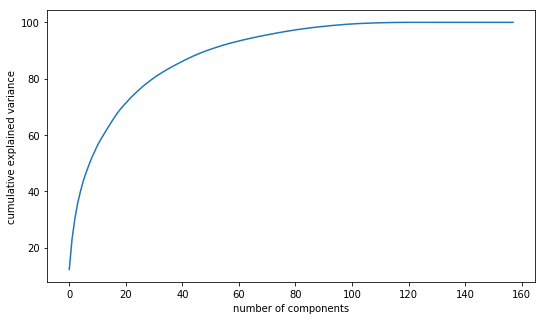

In [80]:
# plot feature variance
features = range(pca.n_components_)

cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)
plt.figure(figsize=(175/20,100/20))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')# 100 elements on y-axis; 175 elements on x-axis; 20 is normalising factor
plt.plot(cumulative_variance)

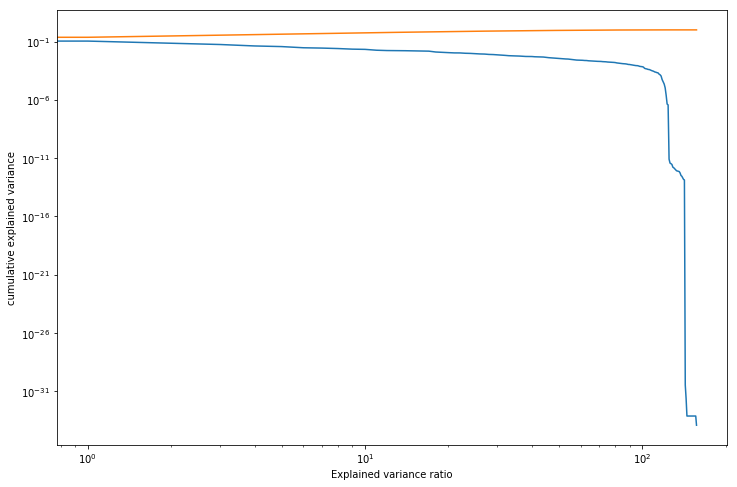

In [81]:
#Making the screeplot - plotting the cumulative variance against the explained variance ration
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.yscale('log')
plt.xscale('log')
plt.plot(pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Explained variance ratio')
plt.ylabel('cumulative explained variance')
plt.show()

In [82]:
# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       12.24
1       23.20
2       30.35
3       35.92
4       40.11
5       43.81
6       46.74
7       49.49
8       52.00
9       54.23
10      56.37
11      58.17
12      59.86
13      61.53
14      63.17
15      64.74
16      66.28
17      67.78
18      69.05
19      70.25
20      71.37
21      72.43
22      73.49
23      74.48
24      75.44
25      76.35
26      77.21
27      78.05
28      78.84
29      79.61
30      80.33
31      81.03
32      81.68
33      82.29
34      82.90
35      83.48
36      84.05
37      84.59
38      85.12
39      85.64
40      86.16
41      86.66
42      87.14
43      87.62
44      88.09
45      88.53
46      88.94
47      89.34
48      89.73
49      90.09
50      90.45
51      90.79
52      91.12
53      91.44
54      91.76
55      92.06
56      92.35
57      92.62
58      92.88
59      93.13
60      93.38
61      93.63
62      93.87
63      94.10
64      94.33
65      94.54
66      94.76
67      94.97
68      95.17
69      95.37
70      95.57
71    

- 50 components explain 90% variance

- 69 components explain 95% variance

In [83]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=50)

In [84]:
df_train_pca1 = pca_final.fit_transform(X_train)
df_train_pca1.shape

(21240, 50)

In [85]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca1.transpose())

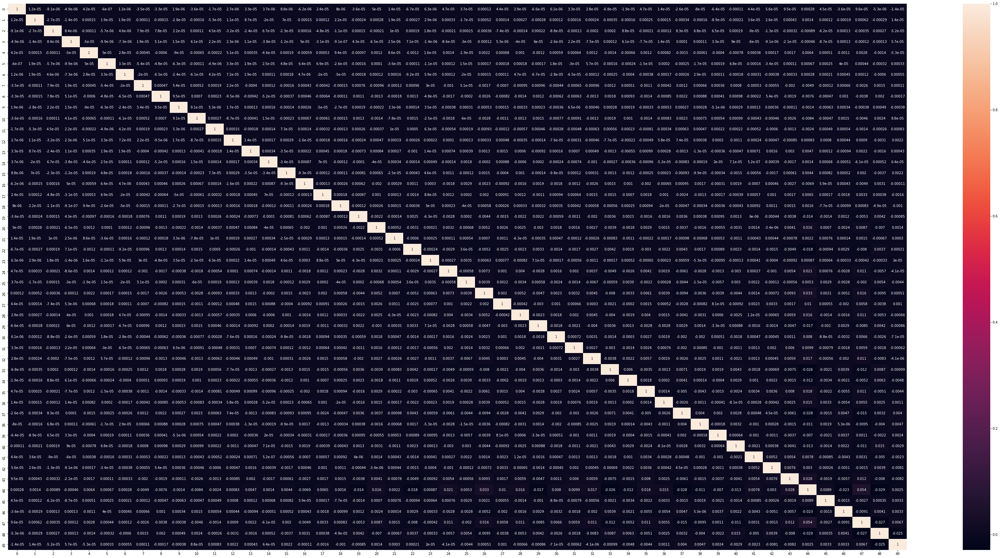

In [86]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (60,30))
sns.heatmap(corrmat,annot = True)

In [87]:
#Applying selected components to the test data
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9103, 50)

In [88]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.05374639818947186 , min corr:  -0.028835923368669962


### Logistic Regression

Logistic Regression is a classification algorithm. It is used to predict a binary outcome or Multi class outcome, given a set of independent variables. Logistic regression is a special case of linear regression when the outcome variable is categorical, where we are using log of odds as dependent variable. In simple words, it predicts the probability of occurrence of an event by fitting data to a logit function. <br>

Let's first fit a model with default hyperparameters.

In [89]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression

learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca1,y_train)

In [90]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.85'

In [91]:
y_pred=model_pca.predict(df_test_pca)

In [92]:
printMetrics(y_test, y_pred)

Confusion Matrix: 
 [[8474   49]
 [ 530   50]]
Sensitivity:  0.9942508506394462
Specificity:  0.08620689655172414
Precision:  0.9411372723234118
Accuracy:  0.9363945951883994


#### Adjusting probability threshold cutoff for logistic regression

We will now try to select the optimum probability threshold for our model

In [93]:
# check the predicted probabilities
y_pred_prob = model_pca.predict_proba(df_test_pca)

In [94]:
# create predicted probability data frame
y_pred_prob_df = pd.DataFrame(y_pred_prob)
y_pred_prob_df = y_pred_prob_df.iloc[:,[1]]

y_test_df = pd.DataFrame(y_test)
y_test_df['ID'] = y_test_df.index

y_pred_prob_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_prob_df
y_pred_final = pd.concat([y_test_df,y_pred_prob_df],axis=1)

In [95]:
# renaming column
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})
y_pred_final.head()

,churn,ID,Churn_Prob
0,0,21926,0.001821
1,0,38686,0.017622
2,0,14426,0.017189
3,0,91682,0.047725
4,0,16172,0.030247


In [96]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex_axis(['ID','churn','Churn_Prob'], axis=1)
y_pred_final.head()

,ID,churn,Churn_Prob
0,21926,0,0.001821
1,38686,0,0.017622
2,14426,0,0.017189
3,91682,0,0.047725
4,16172,0,0.030247


In [97]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,ID,churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,21926,0,0.001821,1,0,0,0,0,0,0,0,0,0
1,38686,0,0.017622,1,0,0,0,0,0,0,0,0,0
2,14426,0,0.017189,1,0,0,0,0,0,0,0,0,0
3,91682,0,0.047725,1,0,0,0,0,0,0,0,0,0
4,16172,0,0.030247,1,0,0,0,0,0,0,0,0,0


In [98]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','speci','sensi'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,speci,sensi]
print(cutoff_df)

     prob  accuracy     speci     sensi
0.0   0.0  0.063715  1.000000  0.000000
0.1   0.1  0.858838  0.674138  0.871407
0.2   0.2  0.923981  0.501724  0.952716
0.3   0.3  0.935406  0.329310  0.976651
0.4   0.4  0.935955  0.158621  0.988854
0.5   0.5  0.936395  0.086207  0.994251
0.6   0.6  0.936504  0.050000  0.996832
0.7   0.7  0.936944  0.031034  0.998592
0.8   0.8  0.937383  0.024138  0.999531
0.9   0.9  0.937054  0.015517  0.999765


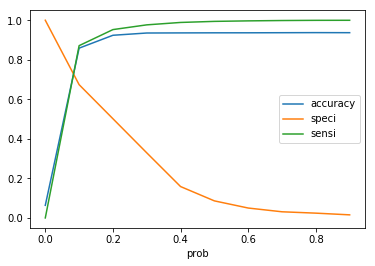

In [99]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','speci','sensi'])

In [100]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.51 else 0)

In [101]:
#Let's check the overall accuracy.
printMetrics(y_pred_final.churn, y_pred_final.final_predicted)

Confusion Matrix: 
 [[8479   44]
 [ 534   46]]
Sensitivity:  0.9948374985333802
Specificity:  0.07931034482758621
Precision:  0.9407522467546877
Accuracy:  0.93650444908272


In [102]:
#Making prediction on the test data
"{:2.2}".format(metrics.roc_auc_score(y_pred_final.churn, y_pred_final.final_predicted))

'0.54'

In [103]:
#Let's check the overall accuracy.
metrics.accuracy_score( y_pred_final.churn, y_pred_final.final_predicted)

0.93650444908272

#### What is Lift measure? 
Lift measures expected benefit with the predictive model compared to a base line model – in essence a random choice. It is the ratio of proportion of the gain to the proportion of random expectation at any given decile level. The random expectation at the xth decile is x%.

In [104]:
def plotLiftChart(actual, predicted,title_str):
    df_dict = {'actual': list (actual), 'pred': list(predicted)}
    df = pd.DataFrame(df_dict)
    pred_ranks = pd.qcut(df['pred'].rank(method='first'), 100, labels=False)
    actual_ranks = pd.qcut(df['actual'].rank(method='first'), 100, labels=False)
    pred_percentiles = df.groupby(pred_ranks).mean()
    actual_percentiles = df.groupby(actual_ranks).mean()
    plt.title(title_str)
    plt.plot(np.arange(.01, 1.01, .01), np.array(pred_percentiles['pred']),
             color='darkorange', lw=2, label='Prediction')
    plt.plot(np.arange(.01, 1.01, .01), np.array(pred_percentiles['actual']),
             color='navy', lw=2, linestyle='--', label='Actual')
    plt.ylabel('Target Percentile')
    plt.xlabel('Population Percentile')
    plt.xlim([0.0, 1.0])
    plt.ylim([-0.05, 1.05])
    from pylab import rcParams
    rcParams['figure.figsize'] = 10, 4

    plt.legend(loc="best")
    plt.show()

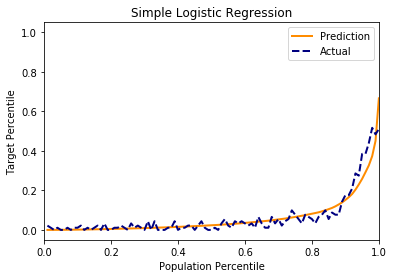

In [105]:
plotLiftChart(y_test.values,pred_probs_test,"Simple Logistic Regression")

- Here we used 90 components, which could nearly explain 85% variance in dataset
- We were able to achieve 95% Area under the curve on the test set

### Building And Evaluating Model for Identifying Important Driver Variables

#### Boosting - XGBoost
##### Applying XGBOOST on the actual variables

<br>
Boosting is a method of converting weak learners into strong learners. In boosting, each new tree is a fit on a modified version of the original data set. <br> 



In [106]:
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.ensemble import RandomForestClassifier

In [107]:
df_for_boostinf = df

In [108]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X1 = df_for_boostinf.drop(['churn','mobile_number'],axis=1)

# Putting response variable to y
y1 = df_for_boostinf['churn']

In [109]:
# Splitting the data into train and test
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1,y1, train_size=0.7,test_size=0.3,random_state=100)

In [110]:
# fit model on training data with default hyperparameters
model = XGBClassifier()
model.fit(X_train1, y_train1)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

In [111]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_pred = model.predict_proba(X_test1)
y_pred[:10]

array([[0.9961167 , 0.00388329],
       [0.8701252 , 0.12987481],
       [0.9966341 , 0.0033659 ],
       [0.33748716, 0.66251284],
       [0.6061454 , 0.3938546 ],
       [0.99579257, 0.00420745],
       [0.95401424, 0.04598574],
       [0.9868918 , 0.01310821],
       [0.6613122 , 0.3386878 ],
       [0.9520634 , 0.04793661]], dtype=float32)

In [112]:
# evaluate predictions
import sklearn.metrics as metrics
roc = metrics.roc_auc_score(y_test1, y_pred[:, 1])
print("Area under the curve: %.2f%%" % (roc * 100.0))

Area under the curve: 91.06%


In [113]:
# hyperparameter tuning with XGBoost
from sklearn.model_selection import GridSearchCV
# creating 5 Fold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        n_jobs = -1,
                        return_train_score=True)      

In [114]:
X_std1 = scaler.fit_transform(X_train1)
X_test_std1 = scaler.fit_transform(X_test1)

In [115]:
# fit the model
model_cv.fit(X_train1, y_train1)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  1.4min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=2, min_child_weight=1, missing=None,
       n_estimators=200, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'learning_rate': [0.2, 0.6], 'subsample': [0.3, 0.6, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=1)

In [116]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,28.301909,0.003643,0.107316,0.004853,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.885458,0.897618,0.898338,0.893804,0.005910,3,0.958905,0.959282,0.958314,0.958834,0.000398
1,35.065531,0.258339,0.101979,0.003496,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.892065,0.905907,0.904000,0.900657,0.006125,2,0.964750,0.965926,0.964188,0.964955,0.000724
2,38.137104,1.024551,0.109904,0.007968,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.894955,0.906048,0.903498,0.901500,0.004744,1,0.968696,0.966948,0.966059,0.967234,0.001096
3,30.719670,0.115118,0.111686,0.004669,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.817497,0.847396,0.855911,0.840266,0.016473,6,0.962107,0.961107,0.958731,0.960648,0.001416
4,35.876853,0.482443,0.089267,0.003147,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.859625,0.872433,0.875868,0.869308,0.006990,5,0.987649,0.986798,0.986342,0.986930,0.000542
5,29.379917,5.129289,0.069610,0.005667,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.867418,0.881251,0.876243,0.874970,0.005719,4,0.992446,0.992621,0.992070,0.992379,0.000230


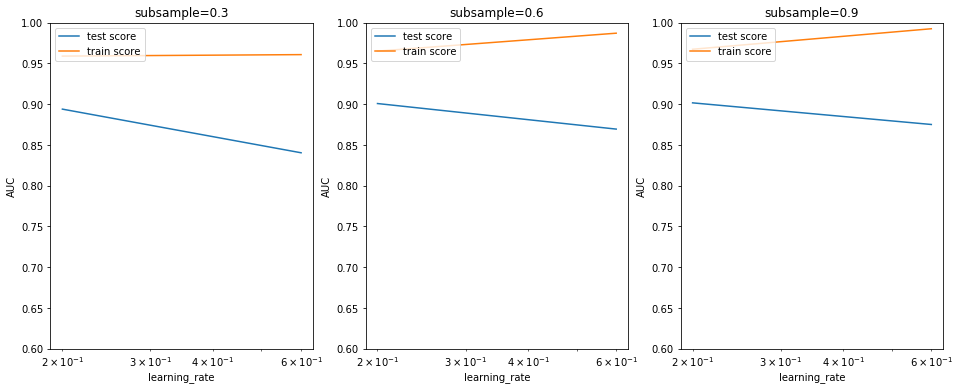

In [117]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    plt.subplot(1,len(param_grid['subsample']), n+1)
    plot_df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(plot_df["param_learning_rate"], plot_df["mean_test_score"])
    plt.plot(plot_df["param_learning_rate"], plot_df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [118]:
# chosen hyperparameters
# from the above graph it is evident that learning_rate =0.2 and subsample=0.9 produces a model with higher AUC with overfitting.
#so using those parameters for the final model.
params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
model = XGBClassifier(params = params)
model.fit(X_train1, y_train1)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic',
       params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200, 'subsample': 0.9, 'objective': 'binary:logistic'},
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1)

In [119]:
# predict
#y_pred_actual was for the predictions interms of churns
#y_pred is for probabilistic predictions used for AUC.
y_pred_actual = model.predict(X_test1)
y_pred = model.predict_proba(X_test1)
y_pred[:10]

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


array([[0.9961167 , 0.00388329],
       [0.8701252 , 0.12987481],
       [0.9966341 , 0.0033659 ],
       [0.33748716, 0.66251284],
       [0.6061454 , 0.3938546 ],
       [0.99579257, 0.00420745],
       [0.95401424, 0.04598574],
       [0.9868918 , 0.01310821],
       [0.6613122 , 0.3386878 ],
       [0.9520634 , 0.04793661]], dtype=float32)

In [120]:
# evaluate predictions
auc = metrics.roc_auc_score(y_test1,y_pred[:, 1])
print("Area under the curve: %.2f%%" % (auc * 100.0))

Area under the curve: 91.06%


In [121]:
printMetrics(y_test1, y_pred_actual)

Confusion Matrix: 
 [[8420  120]
 [ 382  181]]
Sensitivity:  0.9859484777517564
Specificity:  0.32149200710479575
Precision:  0.9566007725516928
Accuracy:  0.9448533450510821


In [122]:
y_pred_train = model.predict(X_train1)

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [123]:
printMetrics(y_train1, y_pred_train)

Confusion Matrix: 
 [[19680   248]
 [  796   516]]
Sensitivity:  0.9875551987153753
Specificity:  0.3932926829268293
Precision:  0.9611252197694863
Accuracy:  0.9508474576271186


Based on the above results for Accuracy, specificity and sensitivity for both training and test data,
there wasn't much deviation except for specificity. So there doesn't seem to be overfitting.

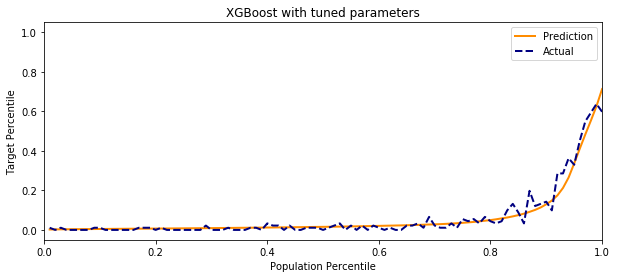

In [124]:
plotLiftChart(y_test1.values,model.predict_proba(X_test1)[:,1],"XGBoost with tuned parameters")

#### Random Forest


Random forest algorithm is based on a concept called bagging - bootstrap aggregating. In random forest, we build a number of decision trees on bootstrap training samples. The samples are chosen, as split candidates from all the X variables (predictors). <br>

In [125]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [126]:
# fit model
model.fit(X_train1, y_train1)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:   11.4s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
       error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=-1, oob_score=False, random_state=None,
            verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'criterion': ['gini', 'entropy'], 'max_features': ['auto', 0.4]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=1)

In [127]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.846961912542379
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 0.4}


In [128]:
# predict churn on test data
y_pred1 = model.predict(X_test1)

In [129]:
# check area under curve
y_pred_prob = model.predict_proba(X_test1)[:, 1]
print("ROC:", round(metrics.roc_auc_score(y_test1, y_pred_prob),2))

ROC: 0.85


In [130]:
printMetrics(y_test1,y_pred1)

Confusion Matrix: 
 [[8449   91]
 [ 431  132]]
Sensitivity:  0.989344262295082
Specificity:  0.2344582593250444
Precision:  0.9514639639639639
Accuracy:  0.942656267164671


In [131]:
# scores of GridSearch CV
scores = model.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.090872,0.262958,0.124938,0.004077,gini,auto,"{'criterion': 'gini', 'max_features': 'auto'}",0.802125,0.841761,0.840161,0.831093,0.832428,0.829513,0.014316,4,0.999749,0.999812,0.999759,0.999818,0.999800,0.999788,0.000028
1,7.511068,0.223293,0.123918,0.002164,gini,0.4,"{'criterion': 'gini', 'max_features': 0.4}",0.805796,0.856198,0.827367,0.840363,0.839623,0.833868,0.016760,3,0.999714,0.999799,0.999734,0.999842,0.999781,0.999774,0.000046
2,1.956126,0.107615,0.125703,0.005308,entropy,auto,"{'criterion': 'entropy', 'max_features': 'auto'}",0.807951,0.844040,0.833847,0.838659,0.851467,0.835191,0.014827,2,0.999906,0.999807,0.999695,0.999837,0.999878,0.999825,0.000073
3,3.684158,1.036091,0.112847,0.002550,entropy,0.4,"{'criterion': 'entropy', 'max_features': 0.4}",0.817915,0.841582,0.847338,0.861644,0.866347,0.846962,0.017113,1,0.999735,0.999868,0.999836,0.999848,0.999804,0.999818,0.000047


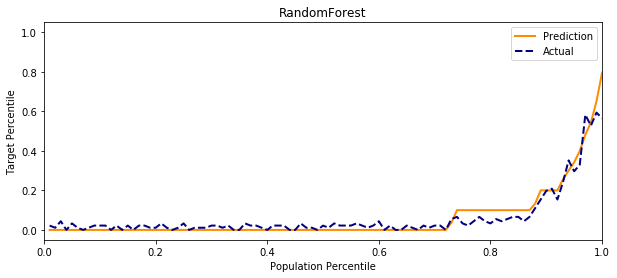

In [132]:
plotLiftChart(y_test1.values,model.predict_proba(X_test1)[:,1],"RandomForest")

In [133]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train1.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

13


In [134]:
# fit model
rf_model.fit(X_train1, y_train1)

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.0s finished


RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=None, max_features=13,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=100, n_jobs=1, oob_score=True, random_state=4,
            verbose=1, warm_start=False)

In [135]:
# OOB score
rf_model.oob_score_

0.9442090395480226

In [136]:
# predict churn on test data
y_pred2 = rf_model.predict(X_test1)

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


In [137]:
printMetrics(y_test1,y_pred2)

Confusion Matrix: 
 [[8457   83]
 [ 424  139]]
Sensitivity:  0.9902810304449648
Specificity:  0.2468916518650089
Precision:  0.9522576286454228
Accuracy:  0.9443040755794793


In [138]:
# check area under curve
y_pred_prob = rf_model.predict_proba(X_test1)[:, 1]
print("ROC:", round(metrics.roc_auc_score(y_test1, y_pred_prob),2))

ROC: 0.9


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


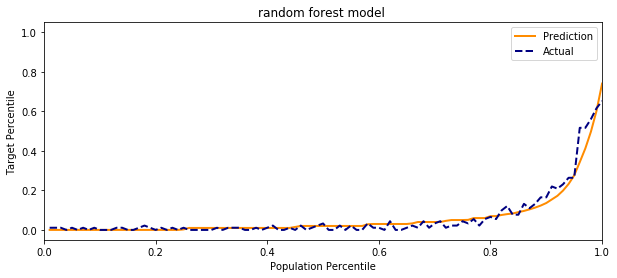

In [139]:
plotLiftChart(y_test1.values,rf_model.predict_proba(X_test1)[:,1],"random forest model ")

#### List of Important features

In [140]:
# predictors
features = X_train1.columns
# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(10)

Sum of importance= 100.0


,variables,importance_percentage
0,total_ic_mou_8,5.011848
1,roam_og_mou_8,4.895717
2,loc_ic_t2m_mou_8,4.294754
3,roam_ic_mou_8,3.821360
4,loc_ic_mou_8,3.676792
5,loc_og_mou_8,3.373877
6,loc_ic_t2t_mou_8,3.280876
7,total_rech_amt_8,2.968535
8,last_day_rch_amt_8,2.486823
9,loc_og_t2m_mou_8,2.395064


In [141]:
# extract top 'n' features
top_n = 30
top_features = feature_importance.variables[0:top_n]

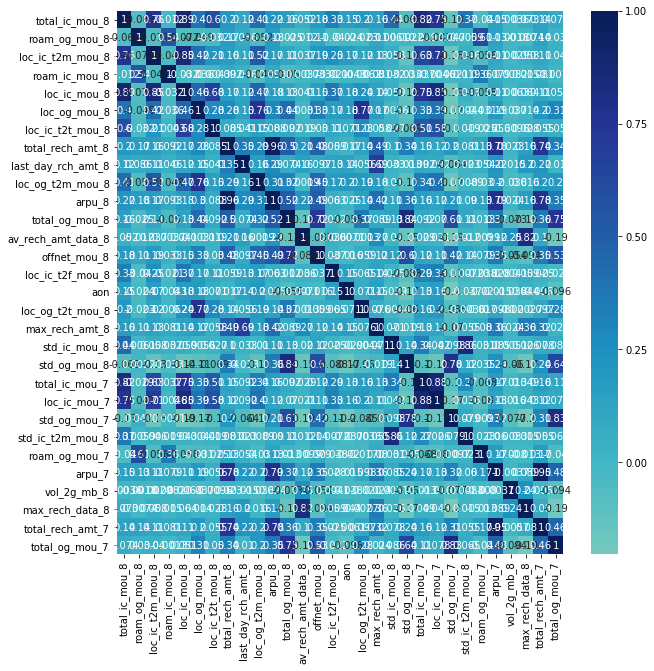

In [142]:
# plot feature correlation
import seaborn as sns
plt.rcParams["figure.figsize"] =(10,10)
mycmap = sns.diverging_palette(199, 359, s=99, center="light", as_cmap=True)
sns.heatmap(data=X_train1[top_features].corr(), center=0.0,annot = True,cmap="YlGnBu")

In [143]:
top_features1=top_features[:10]
X_train2 = X_train1[top_features1]
X_test2 = X_test1[top_features1]

In [144]:
# logistic regression
from sklearn.pipeline import Pipeline
steps = [('scaler', StandardScaler()), 
         ("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))
        ]

# compile pipeline
logistic = Pipeline(steps)

# hyperparameter space
params = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [145]:
# fit model
model.fit(X_train2, y_train1)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    7.6s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('logistic', LogisticRegression(C=1.0, class_weight={0: 0.1, 1: 0.9}, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=1)

In [146]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8251342873816618
Best hyperparameters:  {'logistic__C': 10, 'logistic__penalty': 'l1'}


In [147]:
# predict churn on test data
y_pred2 = model.predict(X_test2)

In [148]:
# check the predicted probabilities
y_pred_prob = model.predict_proba(X_test2)

In [149]:
# create predicted probability data frame
y_pred_prob_df = pd.DataFrame(y_pred_prob)
y_pred_prob_df = y_pred_prob_df.iloc[:,[1]]

y_test_df = pd.DataFrame(y_test1)
y_test_df['ID'] = y_test_df.index

y_pred_prob_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_prob_df
y_pred_final = pd.concat([y_test_df,y_pred_prob_df],axis=1)

In [150]:
# renaming column
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})
y_pred_final.head()

,churn,ID,Churn_Prob
0,0,87540,0.388822
1,1,88274,0.529104
2,0,17428,0.001663
3,1,88159,0.493926
4,0,92753,0.660651


In [151]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex_axis(['ID','churn','Churn_Prob'], axis=1)
y_pred_final.head()

,ID,churn,Churn_Prob
0,87540,0,0.388822
1,88274,1,0.529104
2,17428,0,0.001663
3,88159,1,0.493926
4,92753,0,0.660651


In [152]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,ID,churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,87540,0,0.388822,1,1,1,1,0,0,0,0,0,0
1,88274,1,0.529104,1,1,1,1,1,1,0,0,0,0
2,17428,0,0.001663,1,0,0,0,0,0,0,0,0,0
3,88159,1,0.493926,1,1,1,1,1,0,0,0,0,0
4,92753,0,0.660651,1,1,1,1,1,1,1,0,0,0


In [153]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','speci','sensi'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,speci,sensi]
print(cutoff_df)

     prob  accuracy     speci     sensi
0.0   0.0  0.061848  1.000000  0.000000
0.1   0.1  0.297924  0.962700  0.254098
0.2   0.2  0.451829  0.928952  0.420375
0.3   0.3  0.592222  0.868561  0.574005
0.4   0.4  0.728221  0.799290  0.723536
0.5   0.5  0.847413  0.667851  0.859251
0.6   0.6  0.914973  0.479574  0.943677
0.7   0.7  0.930902  0.110124  0.985012
0.8   0.8  0.934417  0.047957  0.992857
0.9   0.9  0.936065  0.015986  0.996721


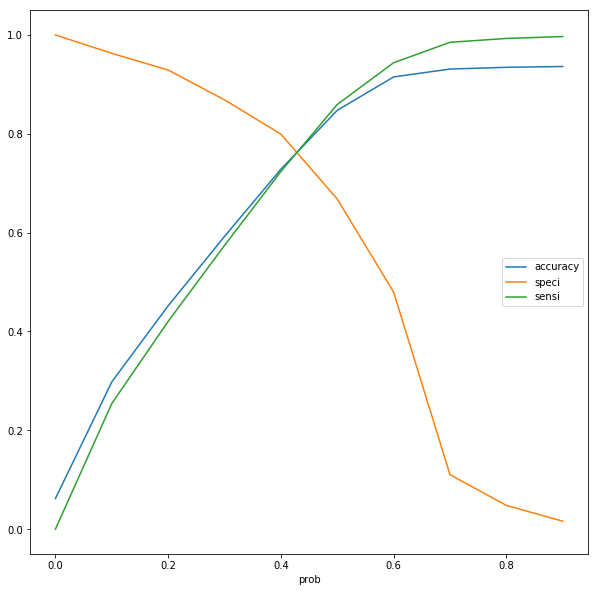

In [154]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','speci','sensi'])

In [155]:
printMetrics(y_test1,y_pred2)

Confusion Matrix: 
 [[7338 1202]
 [ 187  376]]
Sensitivity:  0.8592505854800937
Specificity:  0.6678507992895204
Precision:  0.9751495016611296
Accuracy:  0.847412940788751


In [156]:
# check area under curve
y_pred_prob = model.predict_proba(X_test2)[:, 1]
print("ROC:", round(metrics.roc_auc_score(y_test1, y_pred_prob),2))

ROC: 0.84


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished


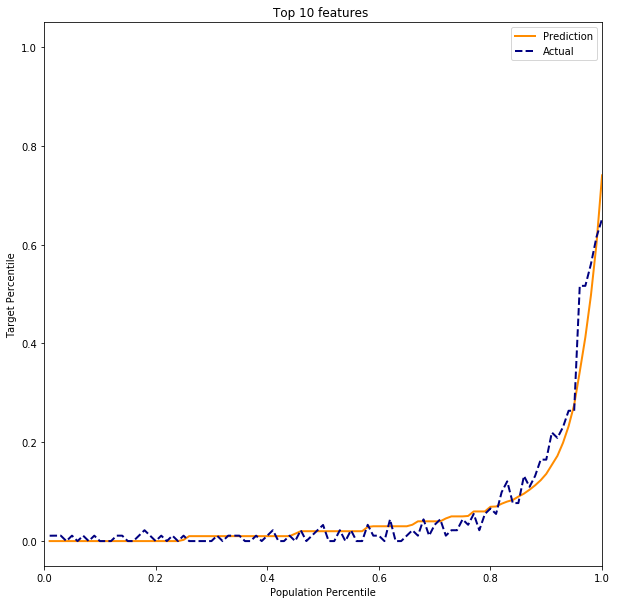

In [157]:
plotLiftChart(y_test1.values,rf_model.predict_proba(X_test1)[:,1],"Top 10 features ")

### Recommendations to reduce Customer Churn

* Telecom company needs to lower roaming charges. They need to provide good offers to the customers who are using services from a roaming zone.This is one of the reasons for pre-paid customers to seek out local operators when on roaming.

* Customized pre-paid plan offers .Continuous monitoring of behavioural signs listed above in action phase to offer customized pe-paid plans to customers, for example customized plans based on where customer minutes of usage (mou) are higher (outgoing/std/t2t/t2m etc).

* Give more discount to the customers who have been with the network for more than an year or less than 3 months, offering them lower tariffs on data usage or talktime offers

* telecom company need to collects customer query and complaint data and work on their services according to the needs of customers. 
